<a href="https://colab.research.google.com/github/bnsreenu/python_for_microscopists/blob/master/334_training_YOLO_V8_EM_platelets_converted_labels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://youtu.be/ytlhMAF6ok0

# **Custom instance model training using YOLOv8**
<p>
This code walks you through the process of training a custom YOLO v8 model using your own data. Here, I am using a public dataset that shows multiple classes for segmentation. This is the same dataset from tutorial 330 (Detectron2) - https://youtu.be/cEgF0YknpZw

<p>
Dataset from: https://leapmanlab.github.io/dense-cell/
<br>
Direct link to the dataset: https://www.dropbox.com/s/68yclbraqq1diza/platelet_data_1219.zip

**Data courtesy of:**
Guay, M.D., Emam, Z.A.S., Anderson, A.B. et al. ​
Dense cellular segmentation for EM using 2D–3D neural network ensembles. Sci Rep 11, 2561 (2021). ​
<p>
To prepare this dataset for YOLO, the binary masks were converted to the YOLO format. Please follow this tutorial to learn about this process. <br>
(https://youtu.be/NYeJvxe5nYw)

<p>

If you already have annotations in COCO format JSON file, for example by annotating using makesense (https://www.makesense.ai/) then the annotations can be imported to Roboflow for conversion to YOLO format. Otherwise, if you are starting from scratch, just annotate datasets on Roboflow. (https://roboflow.com/). You just need to upload your images along with the JSON file and Roboflow will convert them to any other format, in our case YOLO v8. <p>

For information about YOLO models: <p>
https://docs.ultralytics.com/models/yolov8/#key-features
<p>


**Install the required libraries:**

Let us start by installing ultralytics library. All other libraries should be pre-installed on colab. If you are working on a local system, please make sure you install matplotlib, Pillow, numpy, Seaborn, and roboflow. You may also want to install pandas and other libraries depending on the task.

In [1]:
# Install the ultralytics package using pip
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.8/699.8 kB 7.1 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#Enter the adress in your google drive you want yout code and results be saved there
ROOT_DIR = '/content/drive/MyDrive/MSC_THESIS/steps/yolov8_segmentation'

In [5]:
%cd {ROOT_DIR}

/content/drive/MyDrive/MSC_THESIS/steps/yolov8_segmentation


**Install Roboflow**
<p>
to directly read our training data. For colab, we are going to find a workaround to handle encoding issues by the platform. In fact, we may encounter encoding issues for other tasks in Colab so let's go ahead and run the following cell.  

In [6]:
#Withut this Colab is giving an error when installing Roboflow
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In case your annotations are on Roboflow, you can directly import the training data using your API key

In [ ]:
!pip install roboflow
%cd /content/

/content


In [ ]:
# Import your data from Roboflow
"""
from roboflow import Roboflow
rf = Roboflow(api_key=token)
project = rf.workspace("python-for-microscopists-nceyk").project("3d-em-platelet")
dataset = project.version(2).download("yolov8")
"""
#Change the working directory to the downloaded data directory and check the yaml file.
#%cd /content/your_dataset

Let us load the YAML file that contains the names of our classes, number of classes and the directories for train, valid, and test datasets, respectively.

In [7]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/data.yaml

names:
- Debris
nc: 1
roboflow:
  license: CC BY 4.0
  project: debris-detection-hdjpf
  url: https://universe.roboflow.com/blocked-road-object-detection/debris-detection-hdjpf/dataset/5
  version: 5
  workspace: blocked-road-object-detection
test: /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/test
train: /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/train
val: /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/valid

In [8]:
# define number of classes based on YAML
import yaml
with open("/content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [9]:
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [10]:
# Train the model
results = model.train(data='/content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/data.yaml',
                      #project=project,
                      #name=name,
                      epochs=200,
                      patience=0, #I am setting patience=0 to disable early stopping.
                      batch=16,
                      imgsz=640)

Ultralytics YOLOv8.1.1 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/data.yaml, epochs=200, time=None, patience=0, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

100%|██████████| 755k/755k [00:00<00:00, 130MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/train/labels.cache... 1076 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1076/1076 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to runs/segment/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
200 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/200      3.25G      4.041      5.399      3.645       4.05         39        640: 100%|██████████| 68/68 [00:58<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]

                   all        100        549    0.00267      0.146    0.00172   0.000552   0.000633     0.0346   0.000346   7.65e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/200      3.19G      3.495      4.599      3.212      3.377         13        640: 100%|██████████| 68/68 [00:18<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]

                   all        100        549     0.0334      0.118     0.0139    0.00345      0.026        0.1    0.00859    0.00177



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/200      3.13G       3.14      4.472      3.134      3.024         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.98it/s]

                   all        100        549     0.0811     0.0656     0.0277    0.00733     0.0535      0.051     0.0178    0.00368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/200       3.2G       2.92      4.333      2.984      2.814         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        100        549     0.0314      0.415     0.0496     0.0132     0.0178      0.519     0.0411     0.0104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/200       3.2G      2.791      4.263      2.906      2.659         22        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.79it/s]

                   all        100        549      0.147      0.162     0.0758     0.0182      0.157      0.162     0.0763     0.0172



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/200      3.15G      2.669      4.217       2.83      2.575         12        640: 100%|██████████| 68/68 [00:17<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]

                   all        100        549      0.246      0.188      0.131     0.0383      0.271      0.184      0.116     0.0285



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/200      3.14G      2.578      4.169      2.729      2.485         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]

                   all        100        549      0.295      0.208      0.158     0.0495      0.313        0.2      0.159     0.0443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/200      3.13G      2.529      4.182      2.688      2.435         20        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        100        549      0.323      0.264      0.191     0.0627      0.306      0.242      0.171      0.049



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/200      3.16G      2.491      4.112      2.595      2.374         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.21it/s]

                   all        100        549      0.284      0.244      0.164     0.0521      0.256      0.211      0.131     0.0374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/200      3.27G      2.427      4.091       2.54      2.319         38        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.192      0.215      0.108     0.0325      0.173      0.188     0.0886     0.0228



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/200      3.25G      2.391      4.064      2.491      2.261         49        640: 100%|██████████| 68/68 [00:17<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.97it/s]

                   all        100        549      0.306      0.257      0.203       0.06      0.342      0.218      0.189      0.054



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/200      3.32G       2.33      4.012      2.435      2.218         35        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.36it/s]

                   all        100        549      0.382      0.297      0.259     0.0921      0.342      0.271      0.221     0.0713



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/200      3.15G      2.317       3.99      2.367      2.178         25        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.21it/s]

                   all        100        549       0.33      0.308      0.233     0.0827      0.356      0.281      0.231     0.0725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/200      3.16G       2.28      3.976      2.323      2.135         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]

                   all        100        549      0.301      0.268      0.212     0.0745      0.348      0.266      0.213     0.0646



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/200      3.22G      2.264      3.956       2.31      2.117          8        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.87it/s]

                   all        100        549      0.374      0.344      0.285      0.095      0.405      0.346      0.284     0.0865



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/200      3.16G      2.235      3.935      2.218      2.072         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]

                   all        100        549      0.324      0.335      0.248     0.0835      0.371      0.288      0.263     0.0792



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/200      3.24G      2.215      3.891      2.184      2.066         46        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.387      0.281      0.247     0.0867      0.415      0.262      0.244     0.0718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/200      3.18G      2.182      3.869      2.157      2.026         37        640: 100%|██████████| 68/68 [00:16<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        100        549      0.298      0.279      0.205     0.0744      0.314      0.279      0.202     0.0672



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/200      3.13G       2.16      3.877      2.145      2.016         25        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]

                   all        100        549      0.399      0.317      0.276     0.0982      0.442      0.335      0.294      0.094



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/200      3.08G      2.149       3.85      2.103      2.009         21        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]

                   all        100        549      0.421      0.392      0.313      0.122      0.428      0.366      0.303      0.102



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/200      3.15G      2.175      3.869      2.107      2.011         22        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.39it/s]

                   all        100        549      0.407      0.305      0.292      0.113      0.404      0.301      0.292        0.1



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/200      3.17G       2.14      3.852      2.085      1.997         34        640: 100%|██████████| 68/68 [00:18<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.95it/s]

                   all        100        549      0.439      0.348      0.331       0.12      0.444      0.324      0.308      0.105



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/200      3.19G      2.139      3.808      2.055       1.97         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        100        549      0.377      0.339      0.288      0.113      0.394      0.322      0.288     0.0984



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/200      3.13G      2.136      3.784      2.039      1.957         37        640: 100%|██████████| 68/68 [00:17<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.336      0.274      0.229     0.0742      0.342      0.257      0.198     0.0575



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/200      3.09G      2.117       3.81      2.004      1.943         38        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        100        549      0.453      0.333      0.319      0.108      0.473      0.327      0.318      0.104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/200      3.16G      2.109      3.779      2.007      1.932         53        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.45it/s]

                   all        100        549      0.394      0.319       0.28      0.104      0.419      0.322      0.286      0.098



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/200      3.25G      2.108       3.78      2.012      1.948         18        640: 100%|██████████| 68/68 [00:17<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]

                   all        100        549      0.447      0.375      0.357      0.145      0.441      0.373      0.349      0.127



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/200      3.24G      2.099      3.797      1.968      1.919         40        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.01it/s]

                   all        100        549      0.399      0.328      0.312       0.12      0.407      0.335      0.313      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/200      3.24G      2.074      3.753      1.941      1.903         61        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.494      0.403      0.374      0.153      0.487       0.37      0.348       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/200      3.18G      2.063      3.734      1.911      1.896         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.24it/s]

                   all        100        549      0.397      0.342      0.298      0.113      0.418      0.344      0.301      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/200      3.16G      2.066      3.739      1.926      1.898         35        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]

                   all        100        549      0.363      0.337      0.274      0.105      0.375      0.348      0.279      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/200      3.24G      2.048      3.699       1.92       1.89         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.16it/s]

                   all        100        549      0.444      0.393      0.362      0.145      0.457      0.401      0.362      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/200      3.26G      2.038      3.719      1.889      1.891         43        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.73it/s]

                   all        100        549      0.412      0.352      0.328      0.134      0.399       0.35      0.317      0.115



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/200      3.16G       2.08      3.736      1.923      1.885         43        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]

                   all        100        549      0.468      0.375      0.366      0.145      0.487      0.368       0.36      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/200      3.19G      2.046      3.731      1.866      1.865         28        640: 100%|██████████| 68/68 [00:18<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.03it/s]

                   all        100        549      0.304      0.319      0.213     0.0747      0.325      0.316      0.225     0.0665



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/200      3.35G      2.075      3.689      1.944      1.893         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.41it/s]

                   all        100        549      0.422      0.379      0.334      0.133      0.463      0.361      0.339      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/200      3.12G      2.059      3.699      1.905       1.88         51        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.94it/s]

                   all        100        549      0.363      0.372      0.319      0.125      0.422      0.359      0.326       0.12



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/200      3.32G      2.004      3.669      1.817      1.835         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        100        549      0.423      0.342      0.317      0.127      0.432      0.346      0.329      0.119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/200      3.23G      1.998      3.702      1.839      1.841         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]

                   all        100        549       0.42       0.38      0.333      0.135      0.428      0.359      0.322      0.116



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/200      3.16G       1.98      3.675      1.811      1.816         41        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549      0.508      0.364      0.378      0.157        0.5       0.35       0.36      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/200      3.23G      1.988      3.641      1.808      1.816         36        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.00it/s]

                   all        100        549       0.45      0.464      0.439      0.177       0.44      0.423      0.413       0.16



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/200      3.11G      1.996      3.612      1.799      1.827         18        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.14it/s]

                   all        100        549      0.487      0.386      0.373       0.15      0.493      0.377      0.366      0.134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/200      3.23G      1.966      3.643      1.769      1.805         43        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        100        549      0.364      0.344      0.258     0.0943      0.385      0.357      0.257     0.0851



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/200      3.14G      1.987      3.612      1.769      1.809         39        640: 100%|██████████| 68/68 [00:17<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.512      0.452      0.427       0.18      0.502      0.443      0.409      0.162



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/200      3.19G      1.961      3.613      1.729      1.788         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]

                   all        100        549      0.426      0.395      0.346      0.135      0.445      0.377      0.329       0.12



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/200      3.18G      1.983       3.63      1.762      1.794         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]

                   all        100        549      0.459      0.335      0.337      0.141       0.45      0.386      0.351      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/200      3.38G      1.976      3.617      1.752      1.768         31        640: 100%|██████████| 68/68 [00:18<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.30it/s]

                   all        100        549      0.458        0.4      0.359      0.147      0.462      0.415      0.354      0.135



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/200      3.15G      1.966      3.583      1.718      1.766         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]

                   all        100        549      0.507      0.434      0.397      0.159      0.511      0.441       0.39      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/200      3.13G      1.949      3.592      1.718      1.765         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.30it/s]

                   all        100        549      0.443      0.377      0.344      0.145      0.418      0.355      0.312      0.116



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/200      3.29G      1.952      3.576      1.729      1.771         58        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]

                   all        100        549        0.5       0.45      0.424      0.177      0.491      0.437      0.408      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/200       3.2G      1.946      3.578      1.734      1.766         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        100        549      0.516       0.41      0.416      0.178      0.535      0.415      0.416      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/200      3.24G      1.928      3.562      1.703      1.767         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.94it/s]

                   all        100        549      0.491      0.458      0.424      0.181      0.487      0.459      0.414      0.167



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/200       3.2G      1.907      3.543      1.666       1.72         23        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.41it/s]

                   all        100        549      0.448      0.415      0.406      0.179      0.476      0.424      0.397      0.154



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/200      3.24G      1.931      3.557      1.664      1.729         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.20it/s]

                   all        100        549      0.515      0.441      0.451       0.19      0.514      0.439      0.428      0.171



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/200      3.09G      1.909       3.53      1.657      1.732         25        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.14it/s]

                   all        100        549      0.512      0.424      0.428      0.181      0.512      0.435      0.419      0.164



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/200      3.15G      1.885      3.515      1.625      1.714         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        100        549      0.522      0.424      0.444       0.19      0.527      0.419      0.438      0.166



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/200      3.14G       1.89      3.516      1.622      1.712         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        100        549      0.492      0.439      0.436      0.189      0.469      0.444      0.422      0.172



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/200      3.26G       1.92      3.522      1.641      1.726         68        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.27it/s]

                   all        100        549      0.538      0.444       0.45      0.196      0.512      0.455      0.444      0.179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/200      3.09G      1.894      3.522      1.629      1.715         24        640: 100%|██████████| 68/68 [00:17<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.40it/s]

                   all        100        549      0.445      0.377      0.367      0.152      0.483      0.386      0.375      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/200       3.2G      1.882      3.493      1.621      1.698         42        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.509      0.426       0.43       0.19      0.537      0.432      0.435      0.174



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/200      3.23G       1.89      3.493      1.627      1.706         49        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.40it/s]

                   all        100        549      0.501      0.412      0.392       0.17      0.502      0.403      0.383       0.15



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/200      3.17G      1.869      3.486      1.615      1.698         13        640: 100%|██████████| 68/68 [00:17<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        100        549      0.448      0.444      0.392      0.162      0.511      0.372      0.379      0.147



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/200      3.19G      1.894      3.516      1.617      1.704         44        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]

                   all        100        549      0.521      0.434      0.445      0.194      0.559      0.417      0.445      0.173



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/200      3.25G      1.886      3.521      1.622      1.698         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        100        549      0.537       0.43      0.443      0.186      0.565        0.4      0.416      0.162



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/200      3.19G      1.876      3.494      1.611      1.678         17        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.495      0.457      0.457      0.197      0.493      0.455       0.44      0.175



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/200      3.18G      1.862      3.454      1.598      1.675         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.87it/s]

                   all        100        549      0.415      0.381      0.346      0.147      0.466      0.358       0.35      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/200      3.34G      1.858      3.491      1.597      1.679         47        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.03it/s]

                   all        100        549      0.504      0.472      0.458      0.201       0.51      0.444      0.445      0.183



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/200      3.16G       1.87       3.44      1.568      1.677         51        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.20it/s]

                   all        100        549      0.543      0.397      0.409      0.169      0.548      0.401      0.394      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/200      3.34G      1.854      3.437       1.58      1.684         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.44it/s]

                   all        100        549      0.483      0.503      0.457      0.199      0.519      0.444      0.457      0.176



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/200      3.27G      1.891      3.463      1.594      1.683         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.00it/s]

                   all        100        549      0.468      0.472      0.443      0.199      0.536      0.457      0.456      0.179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/200      3.23G       1.85      3.455      1.566      1.658         19        640: 100%|██████████| 68/68 [00:18<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.27it/s]

                   all        100        549       0.52      0.413      0.432      0.191       0.53      0.401      0.423      0.177



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/200      3.06G      1.847      3.443      1.542       1.65         37        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.37it/s]

                   all        100        549      0.497      0.464      0.454       0.19      0.547      0.428      0.442      0.169



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/200      3.14G      1.858      3.428       1.58      1.678         46        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]

                   all        100        549      0.475      0.421      0.409      0.177      0.501      0.408      0.405      0.161



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/200      3.06G       1.85      3.444      1.542      1.664         41        640: 100%|██████████| 68/68 [00:16<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.554      0.468      0.462      0.205      0.553      0.468      0.443      0.182



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/200      3.16G      1.867      3.411      1.546      1.656         44        640: 100%|██████████| 68/68 [00:17<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.00it/s]

                   all        100        549      0.518      0.481      0.459      0.205      0.515      0.486       0.45      0.187



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/200      3.18G      1.861      3.437      1.567      1.666         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]

                   all        100        549      0.515      0.441      0.445      0.195      0.526      0.431      0.429      0.174



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/200      3.12G      1.828      3.416      1.532      1.633         22        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.27it/s]

                   all        100        549      0.523      0.401      0.421       0.19      0.527      0.408      0.416      0.171



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/200       3.1G      1.845      3.417       1.54      1.653         59        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]

                   all        100        549      0.495      0.423      0.403      0.181      0.492       0.41      0.392      0.165



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/200       3.2G      1.835      3.443      1.548      1.643         22        640: 100%|██████████| 68/68 [00:18<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.97it/s]

                   all        100        549       0.51      0.417       0.42      0.184      0.535      0.423      0.421      0.168



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/200      3.26G      1.823      3.416      1.508      1.633         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        100        549      0.562      0.441      0.468      0.211      0.561      0.432      0.453      0.196



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/200      3.21G      1.806      3.407      1.495      1.626         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]

                   all        100        549      0.499      0.474      0.469      0.209      0.524      0.455      0.468      0.195



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/200      3.27G      1.819      3.407      1.502      1.635         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]

                   all        100        549      0.546      0.441      0.463      0.205      0.548      0.441      0.451       0.19



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/200       3.2G      1.826      3.381      1.533      1.639         28        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.39it/s]

                   all        100        549      0.525      0.457      0.455      0.203      0.553      0.437      0.443      0.181



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/200      3.19G      1.808      3.414      1.491      1.617         37        640: 100%|██████████| 68/68 [00:17<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.55it/s]

                   all        100        549       0.57      0.432      0.482      0.213      0.525      0.454      0.468      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/200      3.16G      1.794      3.376      1.476       1.61         53        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]

                   all        100        549      0.543       0.45      0.465      0.205      0.528      0.437      0.437      0.184



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/200       3.2G      1.813      3.395      1.492      1.617         22        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.13it/s]

                   all        100        549      0.471      0.477       0.45      0.206      0.513      0.463      0.455      0.187



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/200      3.16G       1.81      3.401      1.498      1.623         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]

                   all        100        549      0.496      0.415      0.419      0.181      0.515      0.392      0.408      0.162



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/200      3.12G      1.792      3.382      1.485      1.616         33        640: 100%|██████████| 68/68 [00:16<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]

                   all        100        549       0.55      0.475      0.467      0.206      0.554      0.471      0.456      0.187



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/200       3.2G      1.796      3.377      1.457      1.606         31        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.56it/s]

                   all        100        549      0.543      0.506      0.496       0.22      0.535       0.49      0.483      0.193



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/200      3.14G      1.799      3.338      1.465      1.595         17        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        100        549      0.488      0.494      0.462      0.215      0.516      0.443      0.445      0.188



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/200      3.15G      1.787      3.342      1.456      1.602         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.47it/s]

                   all        100        549      0.509      0.474      0.478      0.214      0.512      0.472      0.465      0.195



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/200      3.12G      1.781      3.352      1.453      1.591         22        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549      0.514      0.496      0.489      0.224      0.531      0.459      0.481        0.2



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/200      3.16G      1.791      3.378      1.444      1.598         28        640: 100%|██████████| 68/68 [00:17<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]

                   all        100        549      0.518      0.483      0.491      0.216       0.51      0.483       0.47      0.194



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/200      3.16G      1.806      3.338      1.467      1.605         23        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.20it/s]

                   all        100        549      0.489      0.462      0.467      0.205      0.493      0.465      0.461      0.191



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/200      3.21G      1.775      3.285      1.407       1.58         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        100        549      0.514      0.481      0.469      0.204      0.517      0.459      0.456      0.186



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/200      3.17G       1.78      3.362      1.463      1.587         35        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        100        549      0.546      0.475      0.476      0.221      0.548      0.474      0.471      0.197



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/200      3.23G      1.782      3.367      1.449      1.577         25        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.36it/s]

                   all        100        549      0.536      0.457      0.473      0.212      0.536      0.428      0.441       0.19



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/200      3.32G      1.776      3.359      1.415      1.578         24        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        100        549      0.506      0.499       0.47      0.207      0.513      0.474       0.44      0.184



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/200      3.33G      1.766      3.293      1.412      1.579         13        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]

                   all        100        549      0.509      0.501      0.501      0.229      0.509      0.495      0.489      0.207



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/200      3.26G      1.766      3.317      1.437      1.596         17        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.14it/s]

                   all        100        549      0.508      0.488       0.47      0.206      0.509      0.457      0.446      0.185



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/200      3.11G      1.757       3.36      1.412      1.581         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.45it/s]

                   all        100        549      0.501       0.49      0.481      0.217      0.535      0.479       0.48      0.198



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/200      3.11G      1.779      3.309      1.423      1.589         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.22it/s]

                   all        100        549      0.539      0.483      0.502      0.225      0.561      0.474      0.494      0.207



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/200      3.13G      1.757      3.288      1.393      1.554         34        640: 100%|██████████| 68/68 [00:18<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]

                   all        100        549      0.569      0.417      0.477      0.213       0.59      0.423       0.48        0.2



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/200      3.16G      1.756      3.314      1.418      1.572         20        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.517      0.481      0.484      0.221      0.521       0.45       0.46      0.196



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/200      3.17G      1.744      3.278      1.412       1.56          9        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]

                   all        100        549       0.54      0.506      0.516      0.233      0.538      0.505      0.508      0.215



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/200      3.19G      1.742      3.303      1.377      1.566         30        640: 100%|██████████| 68/68 [00:18<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]

                   all        100        549      0.499      0.532      0.499      0.233      0.487      0.519      0.473      0.203



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/200       3.2G      1.749      3.305      1.375      1.549         42        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.513      0.486      0.489      0.218        0.5      0.474      0.477        0.2



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/200      3.21G      1.763      3.284      1.422      1.559         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.45it/s]

                   all        100        549      0.537      0.474      0.497      0.228      0.581      0.441      0.484      0.204



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/200      3.22G      1.737        3.3       1.38      1.544         24        640: 100%|██████████| 68/68 [00:17<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.514      0.466      0.478      0.231      0.532      0.479      0.479      0.209



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/200      3.24G      1.752      3.277      1.389      1.554         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]

                   all        100        549       0.54      0.485      0.503      0.222      0.541      0.477      0.482      0.197



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/200      3.23G      1.747       3.31      1.388      1.553         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.20it/s]

                   all        100        549      0.536      0.483      0.489      0.224      0.547      0.479      0.479      0.205



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/200      3.21G      1.721        3.3      1.377      1.537         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.37it/s]

                   all        100        549      0.507      0.504      0.484      0.217      0.536      0.479      0.473      0.201



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/200      3.21G      1.745      3.293      1.385      1.556         19        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.531      0.492      0.503      0.225      0.552      0.464      0.487      0.206



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/200      3.17G      1.741      3.278      1.367       1.55         59        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        100        549      0.531       0.47      0.479      0.225      0.531       0.47      0.479      0.204



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    115/200      3.22G      1.727      3.262       1.36      1.533         41        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        100        549      0.572       0.47      0.496      0.226      0.559      0.472      0.489      0.202



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    116/200      3.25G      1.707      3.268      1.346      1.526         17        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        100        549      0.588       0.45      0.495      0.229      0.555      0.477      0.499      0.211



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    117/200      3.24G      1.714      3.264      1.344      1.534         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        100        549      0.568      0.453      0.507      0.233      0.573      0.457      0.498      0.211



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    118/200      3.22G      1.695      3.242      1.326      1.524         35        640: 100%|██████████| 68/68 [00:17<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]

                   all        100        549       0.55      0.477      0.499       0.23      0.577      0.481      0.498      0.212



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    119/200      3.24G      1.731      3.289      1.353      1.557         20        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        100        549      0.541      0.501      0.512      0.235      0.542      0.492      0.502      0.214



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    120/200      3.22G      1.721      3.253      1.345      1.528         40        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all        100        549      0.566      0.455       0.49      0.227      0.586      0.468      0.494      0.213



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    121/200      3.11G      1.684      3.225      1.323      1.519         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]

                   all        100        549      0.577       0.49      0.509      0.235      0.581      0.499      0.501      0.212



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    122/200      3.16G      1.697      3.229       1.33      1.519         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.95it/s]

                   all        100        549      0.601       0.47      0.498      0.231      0.594      0.464      0.484      0.211



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    123/200      3.12G      1.716      3.264      1.335      1.534         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]

                   all        100        549      0.576      0.512      0.529      0.255      0.582      0.517      0.531       0.23



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    124/200      3.22G      1.705      3.238      1.321      1.524         41        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        100        549      0.555      0.514      0.529      0.242       0.56      0.514       0.53      0.229



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    125/200      3.14G      1.683      3.231      1.305      1.512         20        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.46it/s]

                   all        100        549      0.587      0.477      0.515      0.234       0.58      0.488      0.501      0.211



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    126/200      3.11G      1.703      3.235      1.322      1.525         47        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        100        549      0.562      0.517      0.509      0.232      0.562      0.499      0.498      0.209



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    127/200      3.23G      1.685      3.242      1.304      1.515         37        640: 100%|██████████| 68/68 [00:17<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549      0.551      0.515      0.522      0.241      0.547      0.514       0.51      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    128/200      3.12G      1.706      3.222      1.326      1.512         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]

                   all        100        549      0.601      0.474      0.506      0.232      0.612      0.483        0.5      0.213



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    129/200      3.12G      1.715      3.241      1.332      1.523         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.20it/s]

                   all        100        549      0.565      0.521      0.538      0.242      0.567      0.523      0.525       0.22



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    130/200      3.11G      1.702      3.254      1.316      1.518         20        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.13it/s]

                   all        100        549       0.58      0.514      0.528      0.239      0.577       0.51       0.52      0.215



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    131/200      3.22G      1.701       3.21      1.308      1.508         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.07it/s]

                   all        100        549      0.556      0.512      0.528      0.246      0.568       0.51      0.518      0.223



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    132/200      3.25G      1.708      3.228      1.315      1.526         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.47it/s]

                   all        100        549      0.599      0.443      0.494      0.231      0.561      0.474      0.501      0.214



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    133/200      3.11G      1.684      3.219      1.308      1.508         41        640: 100%|██████████| 68/68 [00:17<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]

                   all        100        549      0.561      0.521      0.523       0.25      0.556      0.525      0.516      0.225



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    134/200      3.11G      1.658      3.165      1.297      1.492         35        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.554      0.497      0.515       0.24      0.597      0.477      0.511      0.221



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    135/200      3.08G      1.665      3.163      1.278      1.487         38        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all        100        549      0.546      0.514      0.528      0.239      0.543      0.539      0.521      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    136/200       3.3G      1.695      3.251      1.314       1.52         39        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.11it/s]

                   all        100        549       0.57      0.492      0.513      0.236      0.581      0.494      0.508      0.216



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    137/200       3.2G      1.681      3.201      1.286      1.499         34        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]

                   all        100        549      0.559      0.514      0.511      0.235       0.56      0.521      0.506      0.211



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    138/200      3.22G      1.673      3.196       1.29      1.495         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.05it/s]

                   all        100        549      0.554      0.497      0.521      0.242      0.597      0.479      0.521      0.227



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    139/200      3.33G      1.677      3.204      1.301      1.492         21        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]

                   all        100        549      0.571      0.486      0.521      0.239       0.58      0.488      0.519      0.218



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    140/200      3.05G      1.662       3.19      1.277      1.485         45        640: 100%|██████████| 68/68 [00:17<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        100        549      0.595      0.494      0.522      0.246      0.587      0.494      0.511      0.219



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    141/200      3.24G      1.669      3.194      1.292      1.494         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.23it/s]

                   all        100        549      0.564      0.505      0.519      0.241      0.535      0.519      0.501      0.221



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    142/200      3.16G      1.666      3.175       1.28       1.49         16        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549      0.565      0.494      0.514       0.24      0.565       0.49      0.508      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    143/200      3.29G      1.648      3.155      1.256       1.47         38        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549       0.62      0.455      0.515      0.237      0.573      0.481      0.503      0.213



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    144/200      3.19G      1.672      3.142      1.274      1.488         42        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]

                   all        100        549      0.529      0.537      0.523      0.248      0.556      0.532      0.523      0.228



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    145/200      3.18G      1.648      3.167      1.262      1.474         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.39it/s]

                   all        100        549      0.521      0.537      0.511      0.235      0.555      0.515      0.513      0.219



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    146/200      3.34G      1.644      3.148      1.252      1.469         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.37it/s]

                   all        100        549      0.543      0.505      0.517      0.237      0.557      0.515      0.517      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    147/200      3.21G      1.646       3.15      1.259      1.479         13        640: 100%|██████████| 68/68 [00:17<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]

                   all        100        549      0.583      0.483      0.509      0.235      0.585      0.485      0.507      0.218



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    148/200      3.18G      1.647      3.172       1.27      1.472         12        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.36it/s]

                   all        100        549      0.624       0.47      0.519      0.247      0.591      0.484      0.509      0.225



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    149/200      3.18G      1.662      3.147      1.264      1.479         45        640: 100%|██████████| 68/68 [00:17<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.41it/s]

                   all        100        549      0.574      0.506      0.524      0.253      0.599      0.488      0.523      0.232



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    150/200      3.23G      1.638      3.147       1.24      1.476         39        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        100        549      0.549       0.51      0.524      0.246      0.551      0.517      0.523      0.227



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    151/200      3.21G       1.65      3.157      1.242      1.476         46        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.51it/s]

                   all        100        549      0.567      0.513      0.523      0.246      0.586      0.528      0.533       0.23



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    152/200      3.15G      1.629      3.148      1.248      1.469         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.51it/s]

                   all        100        549      0.541      0.525      0.517      0.245      0.564      0.528      0.523      0.226



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    153/200      3.13G      1.655      3.143      1.254      1.477         32        640: 100%|██████████| 68/68 [00:17<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.30it/s]

                   all        100        549      0.574      0.517      0.528      0.241      0.585       0.53      0.524      0.226



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    154/200      3.17G      1.626      3.118      1.243      1.461         44        640: 100%|██████████| 68/68 [00:16<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]

                   all        100        549      0.561      0.503      0.514      0.245      0.596      0.518      0.528      0.231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    155/200      3.09G      1.626       3.13      1.229      1.466         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        100        549      0.525      0.514      0.507       0.24      0.577      0.483      0.511      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    156/200      3.23G       1.63      3.133      1.224      1.461         23        640: 100%|██████████| 68/68 [00:17<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]

                   all        100        549      0.554        0.5       0.52      0.239      0.563      0.514      0.517      0.221



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    157/200      3.11G      1.624      3.092      1.222      1.461         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]

                   all        100        549      0.548      0.534      0.534      0.253      0.553      0.543      0.534       0.23



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    158/200      3.19G      1.615      3.104      1.214      1.444         53        640: 100%|██████████| 68/68 [00:17<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.26it/s]

                   all        100        549       0.58      0.546      0.541      0.253      0.578      0.547      0.538      0.233



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    159/200      3.29G      1.636      3.165      1.236      1.462         27        640: 100%|██████████| 68/68 [00:17<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        100        549      0.581      0.525      0.544      0.253      0.589      0.526      0.543      0.234



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    160/200      3.19G      1.605      3.115      1.202      1.451         18        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]

                   all        100        549      0.579      0.505       0.54      0.251      0.591      0.514       0.54      0.232



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    161/200       3.1G      1.628      3.104      1.234      1.465         20        640: 100%|██████████| 68/68 [00:17<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]

                   all        100        549      0.583      0.536      0.547      0.251      0.597      0.525      0.537      0.231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    162/200      3.17G      1.599      3.112      1.206      1.447         23        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]

                   all        100        549      0.569       0.53      0.541      0.249      0.568      0.539      0.537      0.232



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    163/200      3.11G      1.604       3.12      1.208       1.44         23        640: 100%|██████████| 68/68 [00:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]

                   all        100        549      0.556      0.515      0.529      0.255      0.577      0.534      0.538      0.232



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    164/200      3.09G      1.616      3.088      1.205      1.438         35        640: 100%|██████████| 68/68 [00:17<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all        100        549      0.617      0.477      0.524      0.241      0.627      0.486      0.527      0.227



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    165/200      3.14G      1.611       3.11      1.215      1.441         37        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]

                   all        100        549      0.606       0.49      0.528      0.254      0.576      0.546       0.54      0.233



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    166/200      3.14G      1.605      3.124      1.207       1.44         41        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.83it/s]

                   all        100        549      0.564      0.539      0.546      0.257      0.572      0.546      0.548      0.239



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    167/200      3.23G      1.618      3.096       1.22      1.456         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]

                   all        100        549      0.588      0.514      0.528       0.25       0.62      0.511      0.529      0.231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    168/200      3.18G      1.614      3.125      1.208      1.441         94        640: 100%|██████████| 68/68 [00:17<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all        100        549      0.569      0.477      0.517      0.242      0.599      0.483      0.521      0.228



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    169/200      3.28G      1.593      3.076      1.181      1.429         37        640: 100%|██████████| 68/68 [00:18<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.51it/s]

                   all        100        549      0.561      0.553      0.544      0.252      0.575      0.554      0.539      0.235



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    170/200      3.26G      1.582      3.091       1.17      1.434         21        640: 100%|██████████| 68/68 [00:16<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]

                   all        100        549      0.582      0.514      0.535      0.254      0.584      0.515      0.533      0.234



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    171/200      3.29G      1.593      3.084      1.176      1.434         33        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]

                   all        100        549      0.563      0.508      0.523      0.248      0.574      0.517       0.53       0.23



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    172/200      3.15G      1.608      3.089      1.202      1.444         11        640: 100%|██████████| 68/68 [00:17<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]

                   all        100        549      0.579      0.501      0.527      0.255      0.589      0.501      0.532      0.233



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    173/200      3.21G      1.594      3.117      1.181      1.435         26        640: 100%|██████████| 68/68 [00:18<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        100        549      0.584      0.521      0.543       0.26      0.586      0.524      0.545      0.239



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    174/200      3.21G      1.607      3.073      1.189      1.445         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]

                   all        100        549      0.605      0.494      0.546      0.263      0.608      0.512      0.547      0.242



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    175/200      3.15G      1.575      3.068      1.183      1.428         12        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.57it/s]

                   all        100        549      0.592      0.503      0.545      0.256      0.605      0.514      0.551      0.235



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    176/200      3.08G      1.585       3.07      1.193      1.435         10        640: 100%|██████████| 68/68 [00:17<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.41it/s]

                   all        100        549      0.581      0.492      0.536      0.254      0.646      0.463      0.528      0.231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    177/200      3.11G      1.577      3.052      1.168       1.42         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]

                   all        100        549      0.594      0.501       0.54      0.253      0.617      0.512      0.541      0.238



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    178/200      3.09G      1.592      3.069      1.161      1.426         48        640: 100%|██████████| 68/68 [00:17<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.60it/s]

                   all        100        549      0.603       0.51      0.554      0.257      0.624      0.503      0.545      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    179/200       3.3G      1.577      3.056      1.166      1.423         26        640: 100%|██████████| 68/68 [00:17<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        100        549      0.627      0.495      0.539      0.254      0.626      0.499      0.539      0.235



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    180/200      3.16G      1.585      3.073      1.167      1.424         38        640: 100%|██████████| 68/68 [00:17<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.633      0.495      0.545      0.255      0.634      0.495      0.534      0.235



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    181/200      3.31G      1.582      3.071       1.18      1.425         50        640: 100%|██████████| 68/68 [00:17<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.39it/s]

                   all        100        549      0.594      0.502      0.545      0.258      0.631      0.499      0.536      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    182/200      3.05G      1.566      3.074      1.168      1.426         52        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]

                   all        100        549      0.604      0.501      0.537      0.253      0.607      0.503      0.529      0.234



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    183/200      3.12G      1.577      3.064      1.156      1.426         29        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.44it/s]

                   all        100        549      0.588      0.534      0.554      0.255      0.611      0.506      0.535      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    184/200      3.15G      1.561      3.047      1.161      1.416         25        640: 100%|██████████| 68/68 [00:16<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.36it/s]

                   all        100        549      0.579      0.517      0.538      0.253       0.59      0.515      0.526      0.233



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    185/200      3.21G      1.553      3.028       1.16      1.404         53        640: 100%|██████████| 68/68 [00:17<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549      0.576      0.522      0.541      0.253      0.589      0.528       0.54      0.236



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    186/200      3.18G      1.541       3.02       1.12      1.401         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        100        549      0.602      0.497       0.54      0.256       0.62      0.512      0.544      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    187/200      3.07G      1.558      3.049      1.153      1.408         21        640: 100%|██████████| 68/68 [00:17<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        100        549      0.579      0.531      0.535      0.253      0.597      0.535      0.534      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    188/200      3.16G      1.551      3.036      1.134      1.401         46        640: 100%|██████████| 68/68 [00:17<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.21it/s]

                   all        100        549      0.582       0.51      0.538       0.25      0.597      0.523      0.535      0.235



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    189/200      3.16G      1.575      3.038      1.151       1.41         30        640: 100%|██████████| 68/68 [00:17<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        100        549      0.614       0.51      0.546      0.256      0.609      0.523      0.542      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    190/200      3.22G      1.574      3.067      1.158      1.404         46        640: 100%|██████████| 68/68 [00:17<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.41it/s]

                   all        100        549      0.623      0.512      0.546      0.249      0.622      0.515      0.534      0.234


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    191/200      3.08G      1.562      3.078      1.168       1.44         21        640: 100%|██████████| 68/68 [00:17<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        100        549      0.611      0.505      0.523      0.247      0.614       0.51      0.527      0.226



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    192/200      2.89G      1.505      3.011      1.091      1.402         16        640: 100%|██████████| 68/68 [00:14<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]

                   all        100        549      0.613      0.496      0.532      0.249      0.601      0.528      0.537       0.23



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    193/200         3G      1.513      3.001      1.081      1.413         45        640: 100%|██████████| 68/68 [00:14<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]

                   all        100        549       0.64      0.505      0.551       0.26      0.648      0.513      0.547      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    194/200      2.99G      1.502      2.995      1.047      1.406         15        640: 100%|██████████| 68/68 [00:14<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.45it/s]

                   all        100        549      0.609      0.492      0.536      0.253      0.655      0.494      0.536      0.236



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    195/200      2.91G      1.486      2.978      1.056      1.391         16        640: 100%|██████████| 68/68 [00:14<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]

                   all        100        549      0.602      0.521      0.543      0.254      0.642      0.506      0.545      0.239



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    196/200      2.94G      1.489      2.976      1.058      1.396         11        640: 100%|██████████| 68/68 [00:14<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]

                   all        100        549      0.576       0.53      0.543      0.254      0.601      0.536      0.545      0.236



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    197/200      2.88G      1.489      2.977      1.057      1.395         17        640: 100%|██████████| 68/68 [00:14<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        100        549      0.632      0.477      0.539      0.254      0.643      0.499       0.54      0.235



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    198/200      2.95G      1.497       2.99      1.076      1.412         14        640: 100%|██████████| 68/68 [00:14<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        100        549      0.563      0.525      0.535       0.25      0.602       0.53      0.537      0.233



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    199/200      3.02G      1.487      2.964      1.047      1.405         11        640: 100%|██████████| 68/68 [00:14<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        100        549      0.625      0.492      0.543      0.253      0.615      0.519      0.539      0.234



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    200/200      2.91G      1.488      2.959       1.06      1.391         21        640: 100%|██████████| 68/68 [00:15<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.50it/s]

                   all        100        549      0.619       0.49      0.538      0.254      0.636      0.503      0.538      0.236



200 epochs completed in 1.083 hours.
Optimizer stripped from runs/segment/train2/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train2/weights/best.pt, 6.8MB

Validating runs/segment/train2/weights/best.pt...
Ultralytics YOLOv8.1.1 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]


                   all        100        549       0.61      0.495       0.55      0.263      0.608      0.512      0.547      0.242
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/segment/train2


**Train the model**

In [11]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

All training curves, metrics, and other results are stored as images in the 'runs' directory. Let us open a couple of these images.

**Run inference**

Now that our model is trained, we can use it for inference.

In [12]:
#List the saved models in 'runs' directory. Note that you will see multiple 'train' subdirectories numbered 1, 2, 3, etc. The exact number depends on the number of epochs.
%ls /content/drive/MyDrive/MSC_THESIS/steps/yolov8_segmentation/runs/segment/train/weights/best.pt

/content/drive/MyDrive/MSC_THESIS/steps/yolov8_segmentation/runs/segment/train/weights/best.pt


You can load the best model or the latest. I am picking the latest.

In [14]:
my_new_model = YOLO('/content/drive/MyDrive/MSC_THESIS/steps/yolov8_segmentation/runs/segment/train2/weights/best.pt')

In [32]:
new_image = '/content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/test/images/37-577625-36-927328-_jpg.rf.6bea83a2b6d5d9da25218df3b347146d.jpg'
new_results = my_new_model.predict(new_image, conf=0.2)  #Adjust conf threshold


image 1/1 /content/drive/MyDrive/MSC_THESIS/steps/YOLO_debri_detection/yolo8/Debris-detection-5/test/images/37-577625-36-927328-_jpg.rf.6bea83a2b6d5d9da25218df3b347146d.jpg: 640x640 4 Debriss, 17.7ms
Speed: 1.8ms preprocess, 17.7ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)


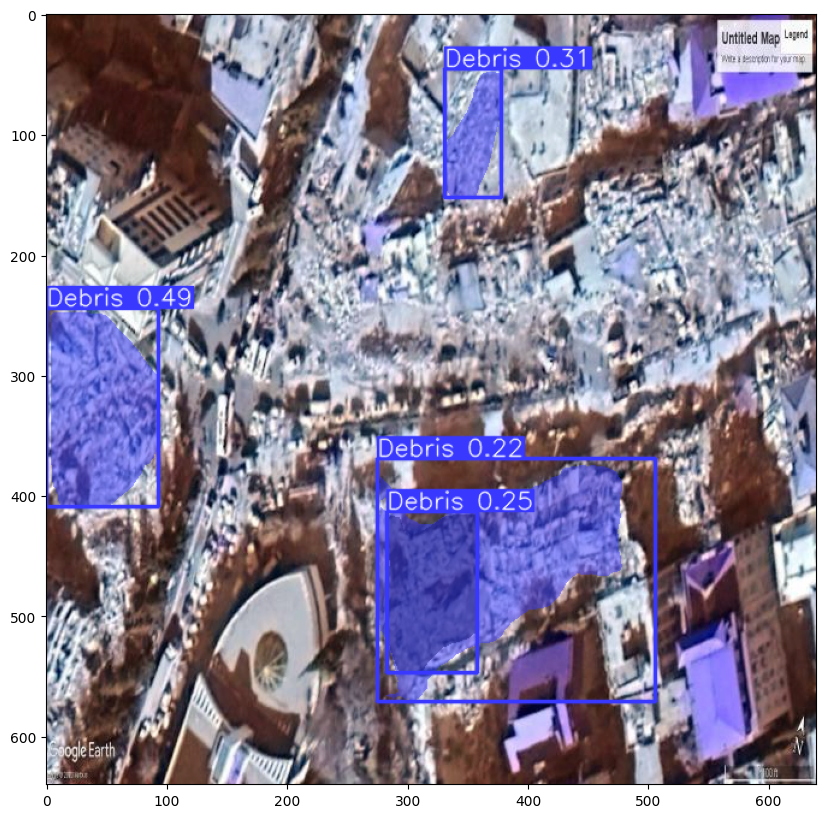

In [33]:
new_result_array = new_results[0].plot()
plt.figure(figsize=(10, 10))
plt.imshow(new_result_array)

In [17]:
new_result = new_results[0]

In [18]:
new_result

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Debris'}
obb: None
orig_img: array([[[142, 154, 166],
        [142, 154, 166],
        [141, 153, 165],
        ...,
        [ 65,  54,  40],
        [ 67,  56,  42],
        [ 68,  57,  43]],

       [[143, 155, 167],
        [143, 155, 167],
        [144, 156, 168],
        ...,
        [ 65,  54,  40],
        [ 66,  55,  41],
        [ 68,  57,  43]],

       [[147, 157, 167],
        [147, 157, 167],
        [148, 158, 168],
        ...,
        [ 64,  53,  39],
        [ 65,  54,  40],
        [ 67,  56,  42]],

       ...,

       [[125, 128, 136],
        [125, 128, 136],
        [125, 128, 136],
        ...,
        [ 80,  71,  58],
        [ 80,  71,  58],
        [ 81,  72,  59]],

       [[126, 129, 137],
        [125, 128, 136],
        [124, 127, 135],
        ...,
        [ 80,  71,  58],
   

In [19]:
#Extracting bounding polygons
#Use 'Masks.xyn' for segments (normalized) and 'Masks.xy' for segments (pixels)
new_result.masks.xyn

[array([[    0.78125,      0.9375],
        [    0.77969,     0.93906],
        [    0.75469,     0.93906],
        [    0.75313,     0.94063],
        [    0.75156,     0.94063],
        [    0.75156,     0.99844],
        [    0.87813,     0.99844],
        [    0.87813,     0.97969],
        [    0.87656,     0.97812],
        [    0.87656,     0.96094],
        [      0.875,     0.95938],
        [      0.875,     0.95781],
        [    0.87344,     0.95625],
        [    0.87344,     0.95312],
        [    0.87187,     0.95156],
        [    0.87187,        0.95],
        [    0.87344,     0.94844],
        [    0.87344,     0.94063],
        [    0.87031,     0.94063],
        [    0.86875,     0.93906],
        [    0.83438,     0.93906],
        [    0.83281,      0.9375]], dtype=float32)]

**Extracting segmented masks**

In [20]:
extracted_masks = new_result.masks.data

In [21]:
extracted_masks.shape

torch.Size([1, 640, 640])

In [22]:
masks_array = extracted_masks.cpu().numpy()

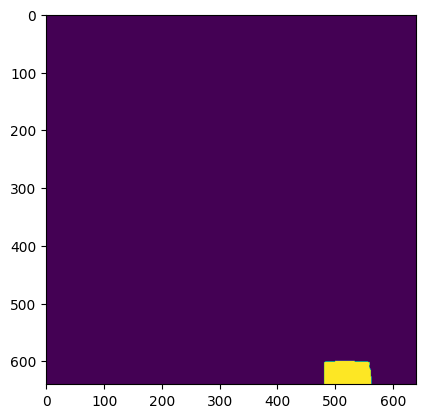

In [23]:
plt.imshow(masks_array[0])

Push the mask to cpu (from GPU) and convert to numpy array for easy plotting.

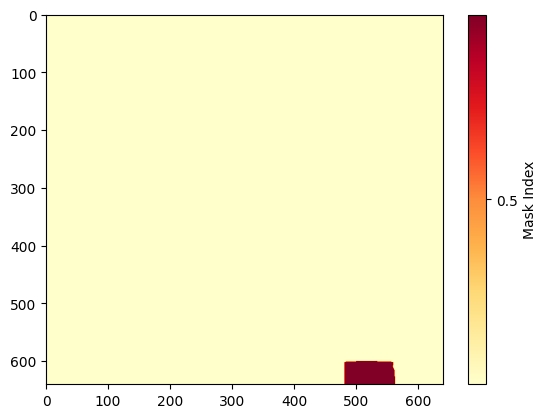

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming masks_array is a NumPy array containing your masks

# Create an empty array to store the overlay
overlay = np.zeros_like(masks_array[0], dtype=np.float32)

# Overlay each mask with different colors
for i in range(len(masks_array)):
    overlay += np.where(masks_array[i] > 0, i + 1, 0)

# Specify the extent to maintain the aspect ratio
extent = (0, masks_array[0].shape[1], masks_array[0].shape[0], 0)

# Display the overlay with the specified extent
plt.imshow(overlay, cmap='YlOrRd', alpha=1, vmin=0, vmax=len(masks_array), extent=extent)
plt.colorbar(ticks=np.arange(len(masks_array)) + 0.5, label='Mask Index')

# Set the aspect ratio to 'auto' to avoid resizing
plt.gca().set_aspect('auto')

plt.show()


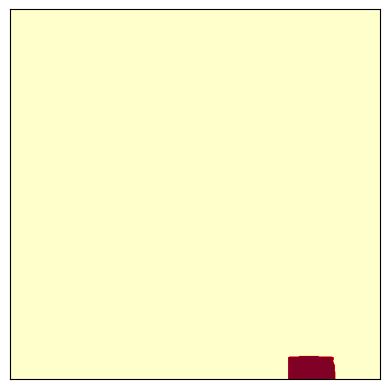

In [25]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Assuming masks_array is a NumPy array containing your masks

# Create an empty array to store the overlay
overlay = np.zeros_like(masks_array[0], dtype=np.float32)

# Overlay each mask with different colors
for i in range(len(masks_array)):
    overlay += np.where(masks_array[i] > 0, i + 1, 0)

# Resize the overlay to 640x640 using NEAREST resampling
overlay_pil = Image.fromarray(overlay)

# Ensure that the overlay image is resized to 640x640 without interpolation
resized_overlay_pil = overlay_pil.resize((640, 640), resample=Image.NEAREST)

# Convert the PIL image back to NumPy array
resized_overlay = np.array(resized_overlay_pil)

# Set up the figure without axes and ticks
fig, ax = plt.subplots()
im = ax.imshow(resized_overlay, cmap='YlOrRd', alpha=1, vmin=0, vmax=len(masks_array))

# Remove x and y ticks
ax.set_xticks([])
ax.set_yticks([])

# Remove x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')

# Remove color bar
fig.colorbar(im, ax=ax).remove()

# Display the plot
plt.show()

